# Yelp Amenity Data cleaning and exploratory analysis

In [314]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import altair as alt
from sklearn.cluster import KMeans
import re
from wordcloud import WordCloud


# Show all columns in dataframes
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

np.seterr(invalid="ignore");

In [196]:
# phila bounds
phl_bound = gpd.read_file("data/Yelp API/phl_bound.geojson")
phl_neigh = gpd.read_file("https://raw.githubusercontent.com/opendataphilly/open-geo-data/master/Neighborhoods_Philadelphia/Neighborhoods_Philadelphia.geojson")
phl_tract = gpd.read_file("data/Yelp API/census-tracts.geojson")

In [197]:
phl_bound_proj = phl_bound.to_crs(2272)
phl_neigh_proj = phl_neigh.to_crs(2272)
phl_tract_proj = phl_tract.to_crs(2272)

In [118]:
neigh = phl_neigh_proj[["mapname", "geometry"]]

In [199]:
tract = phl_tract_proj[["neighborhood_name", "geometry"]]

## Read in amenity files

In [1352]:
# amenities
restaurants = gpd.read_file("data/Yelp API/restaurants.geojson")
parks = gpd.read_file("data/Yelp API/parks.geojson")
education = gpd.read_file("data/Yelp API/education.geojson")
grocery = gpd.read_file("data/Yelp API/grocery.geojson")
entertainment = gpd.read_file("data/Yelp API/entertainment.geojson")
nightlife = gpd.read_file("data/Yelp API/nightlife.geojson")
shopping = gpd.read_file("data/Yelp API/shopping.geojson")
healthcare = gpd.read_file("data/Yelp API/healthcare.geojson")
historic = gpd.read_file("data/Yelp API/historic_landmarks.geojson")
kids = gpd.read_file("data/Yelp API/kids.geojson")
arts = gpd.read_file("data/Yelp API/perf_arts.geojson")

beauty = gpd.read_file("data/Yelp API/beauty.geojson")

In [1222]:
restaurants['type'] = 'restaurant'
parks['type'] = 'parks'
education['type'] = 'education'
grocery['type'] = 'grocery'
entertainment['type'] = 'entertainment'
nightlife['type'] = 'nightlife'
shopping['type'] = 'shopping'
healthcare['type'] = 'healthcare'

historic['type'] = 'historic'
perf_arts['type'] = 'performing arts'
beauty['type'] = 'beauty'
kids['type'] = 'kids'
public_space['type'] = 'public space'

In [1348]:
# combine gdfs
amenities = gpd.GeoDataFrame(pd.concat([restaurants, parks, education, grocery, entertainment, nightlife, healthcare, historic,
                                       arts, beauty, kids, public_space], ignore_index=True))

In [1224]:
len(amenities)

12939

# Clip to Philadelphia boundaries

In [1225]:
phl_bound_squeezed = phl_bound_proj.squeeze().geometry

# Amenity spatial patterns

In [1226]:
amenities_phl = amenities.within(phl_bound_squeezed)
amenities_phl_gdf = amenities[amenities_phl]
amenities_phl_gdf.explore(tiles='CartoDB dark_matter', legend=True, column='type', cmap='Paired')

In [1227]:
# count by type
amenities_grouped = amenities_phl_gdf.groupby('type').size().reset_index(name='count')

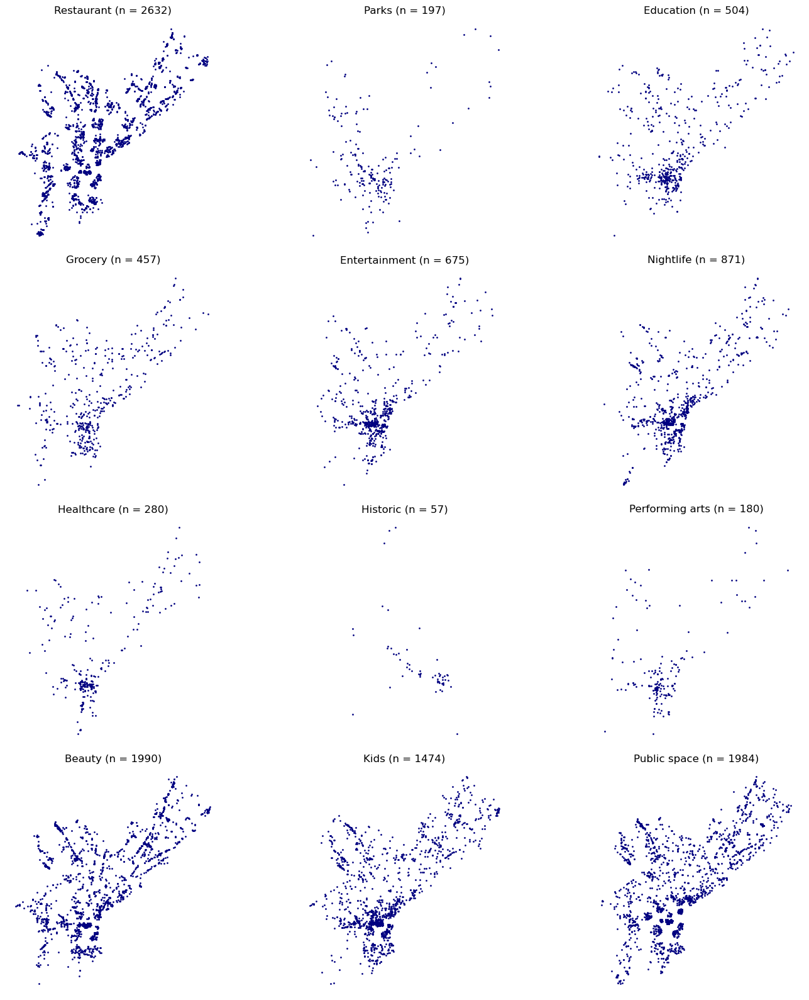

In [1228]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Extract unique business types
business_types = amenities_phl_gdf['type'].unique()

# Determine the number of rows and columns for the subplots
n_rows = len(business_types) // 3 + (len(business_types) % 3 > 0)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, n_rows * 4))

# Flatten the axes array for easy looping
axes = axes.flatten()

# Create a map for each business type
for i, business_type in enumerate(business_types):
    # Filter data for the current business type
    subset = amenities_phl_gdf[amenities_phl_gdf['type'] == business_type]

    # Get count for the current business type
    count = amenities_grouped[amenities_grouped['type'] == business_type]['count'].values[0]

    # Plotting with transparency
    subset.plot(ax=axes[i], color='navy', markersize=1, alpha=1)

    # Set title with count (n = count)
    axes[i].set_title(f"{business_type.capitalize()} (n = {count})")

    # Customizations: Remove boxes, axis ticks, and labels
    axes[i].set_axis_off()

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Display the panel of maps
plt.show()

In [1229]:
amenities_phl_gdf["name"].nunique()

8190

# Data Validation

## Check duplicates

In [1231]:
# Mark duplicates
duplicates = amenities_phl_gdf.duplicated(subset=['name', 'geometry'], keep=False)

# Create a DataFrame with only duplicates
duplicates_df = amenities_phl_gdf[duplicates]

duplicates_df[["name", "alias", "type"]].sort_values(by = "name").tail(40)

,name,alias,type
598,ZIG ZAG BBQ,bbq,restaurant
12890,ZIG ZAG BBQ,bbq,public space
1491,Zahav,mideastern,restaurant
12164,Zahav,mideastern,public space
12771,Zesty's,"greek, mediterranean",public space
2251,Zesty's,"greek, mediterranean",restaurant
3235,ZoomDance,"kids_activities, daycamps, dance_schools",education
9855,ZoomDance,"kids_activities, daycamps, dance_schools",kids
2290,Zorba's Taverna,"greek, mediterranean",restaurant
12807,Zorba's Taverna,"greek, mediterranean",public space


# Neighborhoods and amenities

In [1233]:
amenities_neighborhood = gpd.sjoin(amenities_phl_gdf, tract, how = "left", predicate = "intersects")

In [1234]:
amenities_neigh_group = amenities_neighborhood.groupby(["neighborhood_name", "type"]).size().reset_index(name='count')
amenities_neigh_group_gdf = amenities_neigh_group.merge(phl_tract_proj, how = "left", on = "neighborhood_name")

In [1235]:
amenities_neigh = gpd.GeoDataFrame(amenities_neigh_group_gdf, geometry='geometry')

In [1236]:
amenities_nb = amenities_neigh[["neighborhood_name", "type", "count", "geometry"]]

In [1238]:
amenities_nb[amenities_nb["type"] == "historic"].explore(tiles='CartoDB dark_matter', legend=True, column = "count", cmap = "magma")

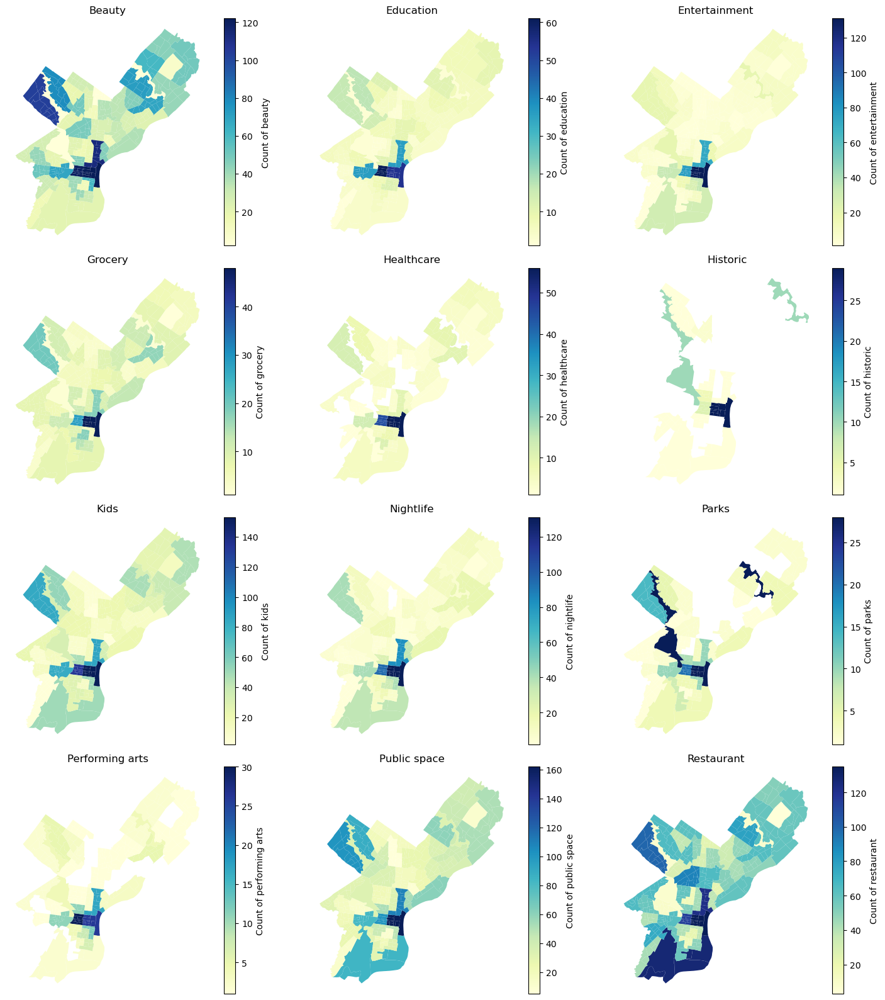

In [1240]:
# Extract unique types
amenity_types = amenities_nb['type'].unique()

# Determine the number of rows and columns for the subplots
n_rows = len(amenity_types) // 3 + (len(amenity_types) % 3 > 0)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, n_rows * 4))

# Flatten the axes array for easy looping
axes = axes.flatten()

# Create a choropleth map for each amenity type
for i, amenity_type in enumerate(amenity_types):
    # Filter data for the current amenity type
    subset = amenities_nb[amenities_nb['type'] == amenity_type]

    # Plotting
    subset.plot(column='count', ax=axes[i], legend=True,
                legend_kwds={'label': "Count of " + amenity_type},
                cmap='YlGnBu')

    # Set title
    axes[i].set_title(amenity_type.capitalize())
    
     # Remove boxes, axis ticks, and axis labels
    axes[i].set_axis_off()

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Display the panel of maps
plt.show()

# Correlation analysis

In [1241]:
# spreading the data
amenities_nb_wide = amenities_nb.pivot_table(index='neighborhood_name', columns='type', values='count', aggfunc=np.mean).fillna(0)

In [1242]:
# Calculating the correlation matrix
correlation_matrix = amenities_nb_wide.corr()

import altair as alt

# Reset index to convert the index into a column for Altair
heatmap_data = correlation_matrix.reset_index().melt('type', var_name='type2', value_name='correlation')

# Create the heatmap
heatmap = alt.Chart(heatmap_data).mark_rect().encode(
    x='type:N',
    y='type2:N',
    color='correlation:Q'
)

# Add text to each cell
text = heatmap.mark_text(baseline='middle').encode(
    text=alt.Text('correlation:Q', format='.2f'),
    color=alt.condition(
        alt.datum.correlation > 0.5, 
        alt.value('white'),
        alt.value('black')
    )
)

# Display the chart
chart = (heatmap + text).properties(width=600, height=600)
chart

alt.LayerChart(...)

- Most are > 0.7
- most collinear vars: shopping, retail, outdoors/public space, nightlife, kids, entertainment, arts

# Category validation
Done:
- restaurants
- parks
- education
- grocery
- nightlife
- entertainment
- shopping
- healthcare
- historic
- kids
- arts

## Restaurants

In [1243]:
# Filter and create a copy to avoid SettingWithCopyWarning
food_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "restaurant"].copy()

# Create a new column 'desc_1'
food_desc["desc_1"] = food_desc['alias'].str.split(',').str[0].str.strip().str.lower()
food_desc["desc_2"] = food_desc['alias'].str.split(',').str[1].str.strip().str.lower()
food_desc["desc_3"] = food_desc['alias'].str.split(',').str[2].str.strip().str.lower()


### First word in "alias"

In [1244]:
# Group by 'desc_1' and count, then convert to DataFrame
food_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_1,count
107,pizza,316
36,chinese,193
117,restaurants,179
45,delis,158
123,seafood,100
17,breakfast_brunch,86
99,newamerican,81
77,hotdogs,81
58,fooddeliveryservices,75
121,sandwiches,75


### Second word in "alias"

In [1245]:
# Group by 'desc_2' and count, then convert to DataFrame
food_desc.groupby("desc_2").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_2,count
111,sandwiches,117
12,breakfast_brunch,86
17,burgers,77
64,hotdogs,74
112,seafood,71
28,chicken_wings,64
131,tradamerican,64
72,italian,43
98,pizza,42
27,cheesesteaks,40


### Third word in "alias"

In [1246]:
# Group by 'desc_3' and count, then convert to DataFrame
food_desc.groupby("desc_3").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_3,count
80,sandwiches,122
94,tradamerican,59
20,chicken_wings,40
49,hotdogs,37
10,breakfast_brunch,36
13,burgers,33
25,coffee,30
81,seafood,26
31,delis,26
79,salad,22


### Replace description 1 with description 2 when description 1 is irrelevant
Words like "restaurant" and "fooddeliveryservices" don't tell us what kind of food is served. Let's replace the description in these cases with something more descriptive. 

In these cases we can search for restaurants where the first word isn't descriptive, then replace the desc_1 with desc_2.

In [1247]:
# replace desc_2
condition1 = food_desc['desc_2'].isin(["food trucks", "foodtrucks", "fooddeliveryservices", "delis", "bars", "grocery", "pubs", "catering", "convenience", 
                                       "sportsbars", "popuprestaurants", "restaurants", "foodstands", "comfortfood", "food_court", "lounges", "breweries", 
                                       "wine_bars", "bowling", "meats", "newamerican", "tradamerican", "american", "buffets", "foodtrucks"])

condition2 = food_desc['desc_3'].notna()

# Update desc_1 where conditions are met
food_desc.loc[condition1 & condition2, 'desc_2'] = food_desc['desc_3']


# replace desc_1
condition1 = food_desc['desc_1'].isin(["food trucks", "foodtrucks", "fooddeliveryservices", "delis", "bars", "grocery", "pubs", "catering", "convenience", 
                                       "sportsbars", "popuprestaurants", "restaurants", "foodstands", "comfortfood", "food_court", "lounges", "breweries", 
                                       "wine_bars", "bowling", "meats", "newamerican", "tradamerican", "american", "buffets", "foodtrucks"])

condition2 = food_desc['desc_2'].notna()

# Update desc_1 where conditions are met
food_desc.loc[condition1 & condition2, 'desc_1'] = food_desc['desc_2']

food_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False)

,desc_1,count
109,pizza,335
37,chinese,198
122,restaurants,179
126,sandwiches,147
128,seafood,124
18,breakfast_brunch,110
47,delis,99
22,burgers,98
78,hotdogs,86
95,mexican,63


Unfortunately this didn't replace "restaurant". Restaurants with only "restaurants" as the first word in their alias usually don't have other descriptive words. This shows that "restaurant" is the default. This calls for another approach.

In [1248]:
food_desc[food_desc["desc_1"] == "restaurants"].head(5)

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
8,Smitty's Restaurant,0.0,5405 Chester Ave,restaurants,Restaurants,POINT (2676904.285 231029.670),restaurant,restaurants,NaN,NaN
10,Kan Yuen Ping,0.0,5428 Chester Ave,restaurants,Restaurants,POINT (2676791.167 230669.291),restaurant,restaurants,NaN,NaN
11,Silver Place,0.0,1500 S 58th St,restaurants,Restaurants,POINT (2673976.157 231063.740),restaurant,restaurants,NaN,NaN
14,Yuan East Restaurant,0.0,1832 S 58th St,restaurants,Restaurants,POINT (2675345.361 229583.321),restaurant,restaurants,NaN,NaN
17,Wei Hua,0.0,5140 Chester Ave,restaurants,Restaurants,POINT (2677863.415 231724.048),restaurant,restaurants,NaN,NaN


By inspecting the names of restaurants lacking descriptions, we can parse out some common categories. 

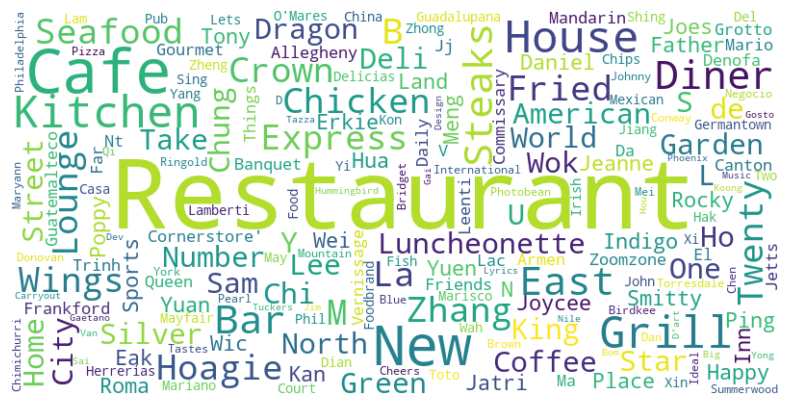

In [1249]:
restaurant_cloud = food_desc[food_desc["desc_1"] == "restaurants"]

# Concatenate all text in the column
text = ' '.join(restaurant_cloud['name'].dropna())

# Create the word cloud
wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [1250]:
# Define the mapping
keyword_mapping = {
    'yuen': 'chinese',
    'ping': 'chinese',
    'zhong': 'chinese',
    'china': 'chinese',
    'canton': 'chinese',
    'wok': 'chinese',
    'lee': 'chinese',
    'china': 'chinese',
    'zhang': 'chinese',
    'chung': 'chinese',
    'dragon': 'chinese',
    'meng': 'chinese',
    'xin': 'chinese',
    'hua': 'chinese',
    'ping': 'chinese',
    'hua': 'chinese',
    'meng': 'chinese',
    'yi': 'chinese',
    'xi': 'chinese',
    'lam': 'chinese',
    'zhang': 'chinese',
    'wei': 'chinese',
    'salad': 'salad',
    'pizza': 'pizza',
    'grill': 'grill',
    "steak": "grill",
    'sushi': 'japanese',
    'chicken': 'chicken',
    'pizzeria': 'pizza',
    'pizza': 'pizza',
    'bbg': 'bbq',
    'hoagie': 'sandwich',
    'steaks': 'sandwich',
    'coffee': 'cafe', 
    'cafe': 'cafe',
    'diner': 'american',
    'luncheonette': 'american',
    'wings': 'wings',
    'deli': 'deli',
    'mexican': 'latin',
    'guadalupana': 'latin',
    'guatamelteco': 'latin',
    'fish': 'seafood',
    'casa': 'latin'}

# Function to find the keyword and return the corresponding desc_2 value
def map_keyword_to_desc(name, mapping):
    for keyword, desc in mapping.items():
        if re.search(re.escape(keyword), name, re.IGNORECASE):
            return desc
    return None

# Define the list of specific values
specific_values = ["food trucks", "fooddeliveryservices", "bars", "grocery", "restaurants"]

# Define the combined condition: desc_2 is NA or in the list of specific values
condition_combined = food_desc['desc_2'].isna() | food_desc['desc_1'].isin(specific_values)

# Apply the function to update desc_2 based on the combined condition
food_desc.loc[condition_combined, 'desc_1'] = food_desc.loc[condition_combined, 'name'].apply(lambda x: map_keyword_to_desc(x, keyword_mapping))

## Reformat into larger categories

In [1251]:
# Define the mapping dictionary
desc_mapping = {
    "burgers": "sandwiches",
    "hotdogs": "sandwiches",
    "chicken_wings": "chicken",
    "tradamerican": "american",
    "newamerican": "american",
    "wings": "chicken",
    "hotdog": "diner/grill",
    "gastropubs": "diner/grill",
    "diners": "diner/grill",
    "steak": "diner/grill",
    "grills": "diner/grill",
    "grill": "diner/grill",
    "coffee": "bakeries/cafes",
    'cafe': "bakeries/cafes",
    "cafes": "bakeries/cafes",
    'bagels': "bakeries/cafes",
    'wraps': "bakeries/cafes",
    'soups': "bakeries/cafes",
    'soup': "bakeries/cafes",
    "cupcakes": "bakeries/cafes",
    "creperies": "bakeries/cafes",
    "bakeries": "bakeries/cafes",
    "juicebars": "bakeries/cafes",
    'donuts': "bakeries/cafes",
    'icecream': "bakeries/cafes",
    "ice cream": 'bakeries/cafes',
    "desserts": "bakeries/cafes",
    "waffles": "bakeries/cafes",
    "cakeshop": "bakeries/cafes",
    'customcakes': 'bakeries/cafes',
    "cheesesteaks": "sandwiches/delis",
    "sandwich": "sandwiches/delis",
    "sandwiches": "sandwiches/delis",
    "delis": "sandwiches/delis",
    "deli": "sandwiches/delis",
    "chickenshop": "chicken",
    "sushi": "japanese",
    "ramen": "japanese",
    'hotpot': 'chinese',
    "szechuan": "chinese",
    "cantonese": "chinese",
    "dimsum": "chinese",
    "shanghainese": "chinese",
    "pretzels": "bakeries/cafes",
    "mexican": "latin",
    "honduran": "latin",
    "nicaraguan": "latin",
    "spanish": "latin",
    "guatemalan": "latin",
    "tacos": "latin",
    "brazilian": "latin",
    "portuguese": "latin",
    "dominican": "caribbean",
    "haitian": "caribbean",
    "seafoodmarket,": "seafood",
    "seafoodmarkets,": "seafood",
    "greek": "mediterranean",
    "mideastern": "halal"
}

# Replace desc_1 values using the mapping dictionary
food_desc['desc_1'] = food_desc['desc_1'].replace(desc_mapping)

In [1252]:
food_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False)

,desc_1,count
68,pizza,322
78,sandwiches/delis,236
8,bakeries/cafes,212
77,sandwiches,167
25,chinese,157
79,seafood,89
24,chicken,79
30,diner/grill,76
14,breakfast_brunch,74
54,latin,69


### Identify fast food/chain restaurants
Override desc_1 with "fastfood" for major chain restaurants.

In [1253]:
food_desc.groupby("name").size().sort_values(ascending = False).head(10)

name
Wawa                         26
McDonald's                   25
Popeyes Louisiana Kitchen    18
Wendy's                      15
Philly Pretzel Factory       13
KFC                          12
Subway                       10
Crown Fried Chicken           8
Burger King                   8
China House                   8
dtype: int64

In [1254]:
fast_food = [
    "McDonald's",
    "Wawa", 
    "Wingstop",
    "MrBeast Burger",
    "Chick-fil-A",
    "Chipotle Mexican Grill",
    "Checkers",
    "Wendy's",
    "Subway",
    "Popeyes Louisiana Kitchen",
    "Taco Bell",
    "KFC",
    "Burger King",
]

In [1255]:
food_desc.loc[food_desc["name"].isin(fast_food), "desc_1"] = "fastfood"

Take the descriptions with frequency < 6 and replace the string with the second term in alias

In [1256]:
desc_counts = food_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False)

# Filter for 'desc_1' values where count is less than 6
desc_less_than_six = desc_counts[desc_counts['count'] < 6]['desc_1']

# Convert the filtered results to a list
desc_list = desc_less_than_six.tolist()

# replace desc_1 with desc_2 where desc_1 is in the list of descriptions with frequency < 6
food_desc.loc[food_desc['desc_1'].isin(desc_list), 'desc_1'] = food_desc['desc_2']

Take descriptions with frequency < 10 and replace with "other"

In [1257]:
# Filter for 'desc_1' values where count is less than 10
desc_less_than_ten = desc_counts[desc_counts['count'] < 10]['desc_1']

# Convert the filtered results to a list
desc_list = desc_less_than_ten.tolist()

food_desc['desc_1'] = food_desc['desc_1'].apply(lambda x: desc_mapping[x] if x in desc_mapping else x)

# Replace desc_1 with desc_2 where desc_1 is in the list of descriptions with frequency < 10
food_desc.loc[food_desc['desc_1'].isin(desc_list) | (food_desc['desc_1'] == "restaurants") | (food_desc['desc_1'].isna()), 'desc_1'] = "other"


In [1258]:
food_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False)

,desc_1,count
21,other,728
22,pizza,323
27,sandwiches/delis,295
2,bakeries/cafes,218
8,chinese,158
12,fastfood,154
28,seafood,91
4,breakfast_brunch,76
11,diner/grill,76
7,chicken,68


## Parks

In [1259]:
# Filter and create a copy to avoid SettingWithCopyWarning
parks_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "parks"].copy()

# Create a new column 'desc_1'
parks_desc["desc_1"] = parks_desc['alias'].str.split(',').str[0].str.strip().str.lower()
parks_desc["desc_2"] = parks_desc['alias'].str.split(',').str[1].str.strip().str.lower()
parks_desc["desc_3"] = parks_desc['alias'].str.split(',').str[2].str.strip().str.lower()

### First word in 'alias'

In [1260]:
# Group by 'desc_1' and count, then convert to DataFrame
parks_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(100)

,desc_1,count
12,parks,90
8,landmarks,31
14,playgrounds,17
2,dog_parks,14
17,recreation,8
6,hiking,7
5,gardens,5
18,skate_parks,5
4,football,3
11,nonprofit,2


### Filter for categories where frequency ≥ 5

In [1261]:
park_desc_1 = parks_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(9)
top_park_desc = list(park_desc_1["desc_1"])
# remove historical landmarks
top_park_desc.remove('landmarks')

# filter for obs in the list of top descriptions
parks_desc = parks_desc[parks_desc["desc_1"].isin(top_park_desc)]
parks_desc.head(10)

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
2697,Cedar Park,4.5,50th St & Baltimore Ave,parks,Parks,POINT (2677006.643 234133.514),parks,parks,NaN,NaN
2698,Chester Avenue Dog Park,3.5,801 S 48th St,dog_parks,Dog Parks,POINT (2678024.964 234174.704),parks,dog_parks,NaN,NaN
2699,Malcolm X Park,4.0,51ST And Pine St,parks,Parks,POINT (2676187.013 235721.062),parks,parks,NaN,NaN
2700,Barkan Park,3.0,4936 Spruce St,"parks, playgrounds","Parks, Playgrounds",POINT (2677109.530 236278.545),parks,parks,playgrounds,NaN
2701,Clark Park Dog Bowl,4.5,43rd & Chester,dog_parks,Dog Parks,POINT (2680815.785 234312.734),parks,dog_parks,NaN,NaN
2702,Clark Park,4.5,43RD And Baltimore,parks,Parks,POINT (2680756.007 234729.865),parks,parks,NaN,NaN
2703,Greys Ferry Cresent Skatepark,5.0,3600 Grays Ferry Ave,skate_parks,Skate Parks,POINT (2683004.637 231400.562),parks,skate_parks,NaN,NaN
2704,Grays Ferry Crescent,4.0,,parks,Parks,POINT (2682813.782 232182.835),parks,parks,NaN,NaN
2705,Lanier Dog Park,4.0,2911 Tasker St,dog_parks,Dog Parks,POINT (2685221.027 229056.524),parks,dog_parks,NaN,NaN
2706,Saunder's Green,3.5,300-50 Saunders Ave,parks,Parks,POINT (2683400.920 238616.685),parks,parks,NaN,NaN


## Education

In [1262]:
# Filter and create a copy to avoid SettingWithCopyWarning
edu_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "education"].copy()

# Create a new column 'desc_1'
edu_desc["desc_1"] = edu_desc['alias'].str.split(',').str[0].str.strip().str.lower()
edu_desc["desc_2"] = edu_desc['alias'].str.split(',').str[1].str.strip().str.lower()
edu_desc["desc_3"] = edu_desc['alias'].str.split(',').str[2].str.strip().str.lower()

### First word in alias

In [1263]:
# Group by 'desc_1' and count, then convert to DataFrame
edu_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(20)

,desc_1,count
11,childcare,61
25,elementaryschools,50
61,preschools,47
13,collegeuniv,43
38,highschools,27
69,specialtyschools,19
24,educationservices,17
22,driving_schools,17
73,theater,14
6,artschools,13


### Filter for frequency ≥ 6

In [1264]:
edu_desc_1 = edu_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(18)
top_edu_desc = list(edu_desc_1["desc_1"])
# remove historical landmarks
top_edu_desc.remove('theater')

# filter for obs in the list of top descriptions
edu_desc_1 = edu_desc[edu_desc["desc_1"].isin(top_edu_desc)]
edu_desc.head(10)

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
3004,BellyWise,5.0,NaN,"midwives, specialtyschools","Midwives, Specialty Schools",POINT (2676169.939 231988.984),education,midwives,specialtyschools,NaN
3005,Limitless CPR,5.0,NaN,cprclasses,CPR Classes,POINT (2677042.522 231394.414),education,cprclasses,NaN,NaN
3006,Michele Judge,5.0,4919 Pentridge St,"jewelryrepair, artclasses, jewelry","Jewelry Repair, Art Classes, Jewelry",POINT (2677304.635 233898.273),education,jewelryrepair,artclasses,jewelry
3007,Kipp West Philadelphia Prep Charter,1.0,5900 Baltimore Ave,specialed,Special Education,POINT (2671666.162 232636.864),education,specialed,NaN,NaN
3008,Beulah Baptist Christian Day School,2.0,5001 Spruce St,"elementaryschools, preschools","Elementary Schools, Preschools",POINT (2677065.563 236331.076),education,elementaryschools,preschools,NaN
3009,The Academy of Industrial Arts,5.0,6328 Paschall Ave,"vocation, electricians","Vocational & Technical School, Electricians",POINT (2674851.743 225884.662),education,vocation,electricians,NaN
3010,TYLII,3.0,5124 Walnut St,"preschools, childcare","Preschools, Child Care & Day Care",POINT (2676415.568 237130.841),education,preschools,childcare,NaN
3011,University of the Sciences,3.0,600 S 43rd St,collegeuniv,Colleges & Universities,POINT (2681062.408 233555.127),education,collegeuniv,NaN,NaN
3012,All Around This World,5.0,4336 Pine St,educationservices,Educational Services,POINT (2680347.395 235381.376),education,educationservices,NaN,NaN
3013,Jubilee School,3.0,4211 Chester Ave,highschools,Middle Schools & High Schools,POINT (2681043.809 234475.721),education,highschools,NaN,NaN


## Grocery

In [1265]:
# Filter and create a copy to avoid SettingWithCopyWarning
grocery_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "grocery"].copy()

# Create a new column 'desc_1'
grocery_desc["desc_1"] = grocery_desc['alias'].str.split(',').str[0].str.strip().str.lower()
grocery_desc["desc_2"] = grocery_desc['alias'].str.split(',').str[1].str.strip().str.lower()
grocery_desc["desc_3"] = grocery_desc['alias'].str.split(',').str[2].str.strip().str.lower()

In [1266]:
grocery_desc.head()

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
3694,Kim A Grocery & Deli,1.0,1840 S 58th St,grocery,Grocery,POINT (2675396.135 229529.164),grocery,grocery,NaN,NaN
3695,S and J Seafood,4.0,713 S 52nd St,"seafoodmarkets, grocery","Seafood Markets, Grocery",POINT (2675793.250 234207.384),grocery,seafoodmarkets,grocery,NaN
3696,Mariposa Food Co-op,4.0,4824 Baltimore Ave,"grocery, healthmarkets","Grocery, Health Markets",POINT (2677563.153 234052.277),grocery,grocery,healthmarkets,NaN
3697,Jennifer Grocery,2.5,4824 Chester Ave,"grocery, convenience","Grocery, Convenience Stores",POINT (2678754.671 232771.760),grocery,grocery,convenience,NaN
3698,Fu-Wah Mini Market,4.5,810 S 47th St,"convenience, sandwiches, grocery","Convenience Stores, Sandwiches, Grocery",POINT (2678571.989 234207.924),grocery,convenience,sandwiches,grocery


## Nightlife

In [1267]:
# Filter and create a copy to avoid SettingWithCopyWarning
night_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "nightlife"].copy()

# Create a new column 'desc_1'
night_desc["desc_1"] = night_desc['alias'].str.split(',').str[0].str.strip().str.lower()
night_desc["desc_2"] = night_desc['alias'].str.split(',').str[1].str.strip().str.lower()
night_desc["desc_3"] = night_desc['alias'].str.split(',').str[2].str.strip().str.lower()

In [1268]:
night_desc.head()

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
5152,Pentridge Station Beer Garden,4.5,5116 Pentridge St,beergardens,Beer Gardens,POINT (2676581.781 233167.788),nightlife,beergardens,NaN,NaN
5153,720 Bistro,4.0,720 S.52nd st,"seafood, breakfast_brunch, cocktailbars","Seafood, Breakfast & Brunch, Cocktail Bars",POINT (2675620.054 234102.746),nightlife,seafood,breakfast_brunch,cocktailbars
5154,Bayou,4.5,5025 Baltimore Ave,lounges,Lounges,POINT (2676525.799 234061.840),nightlife,lounges,NaN,NaN
5155,Booker's Restaurant and Bar,3.5,5021 Baltimore Ave,"bars, breakfast_brunch, tradamerican","Bars, Breakfast & Brunch, American",POINT (2676559.222 234070.085),nightlife,bars,breakfast_brunch,tradamerican
5156,The Wine Garden,4.5,5019 Baltimore Ave,wine_bars,Wine Bars,POINT (2676563.551 234060.148),nightlife,wine_bars,NaN,NaN


### Alias

In [1269]:
# Group by 'desc_1' and count, then convert to DataFrame
night_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_1,count
6,bars,147
73,pubs,58
84,sportsbars,57
33,divebars,44
65,newamerican,42
59,lounges,41
22,cocktailbars,36
97,tradamerican,35
45,hookah_bars,26
28,danceclubs,25


In [1270]:
# Group by 'desc_2' and count, then convert to DataFrame
night_desc.groupby("desc_2").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_2,count
6,bars,76
99,tradamerican,46
24,cocktailbars,39
89,sportsbars,37
66,newamerican,33
59,lounges,26
83,seafood,23
65,musicvenues,22
77,pubs,18
13,breakfast_brunch,16


In [1271]:
# Group by 'desc_3' and count, then convert to DataFrame
night_desc.groupby("desc_3").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_3,count
17,cocktailbars,44
68,tradamerican,30
3,bars,20
8,breakfast_brunch,19
6,beerbar,17
70,venues,15
10,burgers,12
60,sportsbars,12
54,sandwiches,12
47,newamerican,10


### Replace desc_1 with more relevant alias terms

In [1272]:
# replace desc_2
condition1 = night_desc['desc_2'].isin(["newamerican", "seafood", "breakfast_brunch", "tradamerican", "burgers", "sandwiches", "pizza", "mexican", "italian",
                                       "french", "ramen", "tapasmallplates", "french", "ramen", "mideastern", "comfortfood", "steak", "mediterranean", "caribbean",
                                       "bbq", "peruvian", "japanese", "ethiopian", "tex-mex", "southern", "juicebars", "cajun", "soulfood", "portugeuse", "sushi",
                                       "vegan", "cafes", "diners", "chicken-wings", "chinese", "salad", "cheesesteaks", "african", "german", "desserts", "indpak",
                                       "thai", "tacos", "falafel", "vietnamese", "waffles", "delis", "coffee", "korean", "hotdog", "moroccan", "newmexican", "cuban",
                                       "argentine", "gluten_free", "russian", "bakeries", "portuguese", "spanish", "latin", "catering", "gastropubs", 
                                       "breweries", "gaybars", "whiskeybars", "tikibars", "tobaccoshops", "beer_and_wine", "breweries", "venues",
                                       "poolhalls", "jazzandblues", "airportlounges", "cigarbars", "speakeasies", "theater", "nightlife"])

condition2 = night_desc['desc_3'].notna()

# Update desc_1 where conditions are met
night_desc.loc[condition1 & condition2, 'desc_2'] = night_desc['desc_3']


# replace desc_1
condition1 = night_desc['desc_1'].isin(["newamerican", "seafood", "breakfast_brunch", "tradamerican", "burgers", "sandwiches", "pizza", "mexican", "italian",
                                       "french", "ramen", "tapasmallplates", "french", "ramen", "mideastern", "comfortfood", "steak", "mediterranean", "caribbean",
                                       "bbq", "peruvian", "japanese", "ethiopian", "tex-mex", "southern", "juicebars", "cajun", "soulfood", "portugeuse", "sushi",
                                       "vegan", "cafes", "diners", "chicken-wings", "chinese", "salad", "cheesesteaks", "african", "german", "desserts", "indpak",
                                       "thai", "tacos", "falafel", "vietnamese", "waffles", "delis", "coffee", "korean", "hotdog", "moroccan", "newmexican", "cuban",
                                       "argentine", "gluten_free", "russian", "bakeries", "portuguese", "spanish", "latin", "catering", "gastropubs", 
                                       "breweries", "gaybars", "whiskeybars", "tikibars", "tobaccoshops", "beer_and_wine", "breweries", "venues",
                                       "poolhalls", "jazzandblues", "airportlounges", "cigarbars", "speakeasies", "theater", "nightlife"])

condition2 = night_desc['desc_2'].notna()

# Update desc_1 where conditions are met
night_desc.loc[condition1 & condition2, 'desc_1'] = night_desc['desc_2']

night_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(15)

,desc_1,count
4,bars,228
11,cocktailbars,95
48,sportsbars,85
43,pubs,69
37,lounges,55
19,divebars,49
6,beerbar,39
56,wine_bars,38
38,musicvenues,36
29,hookah_bars,33


### Filter for categories where frequency ≥ 8

In [1273]:
night_desc_1 = night_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(9)
top_night_desc = list(night_desc_1["desc_1"])

# filter for obs in the list of top descriptions
night_desc = night_desc[night_desc["desc_1"].isin(top_night_desc)]
night_desc.head(10)

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
5153,720 Bistro,4.0,720 S.52nd st,"seafood, breakfast_brunch, cocktailbars","Seafood, Breakfast & Brunch, Cocktail Bars",POINT (2675620.054 234102.746),nightlife,cocktailbars,cocktailbars,cocktailbars
5154,Bayou,4.5,5025 Baltimore Ave,lounges,Lounges,POINT (2676525.799 234061.840),nightlife,lounges,NaN,NaN
5155,Booker's Restaurant and Bar,3.5,5021 Baltimore Ave,"bars, breakfast_brunch, tradamerican","Bars, Breakfast & Brunch, American",POINT (2676559.222 234070.085),nightlife,bars,tradamerican,tradamerican
5156,The Wine Garden,4.5,5019 Baltimore Ave,wine_bars,Wine Bars,POINT (2676563.551 234060.148),nightlife,wine_bars,NaN,NaN
5157,Carbon Copy,4.5,701 S 50th St,"breweries, pizza, bars","Breweries, Pizza, Bars",POINT (2676997.957 233927.765),nightlife,bars,bars,bars
5158,Dock Street Cannery and Tasting Room,4.0,705 S 50th St,"beerbar, lounges","Beer Bar, Lounges",POINT (2677046.168 233912.738),nightlife,beerbar,lounges,NaN
5159,Trendsetters Bar & Lounge,3.5,5301 Woodland Ave,"burgers, lounges, wraps","Burgers, Lounges, Wraps",POINT (2678439.957 230236.502),nightlife,lounges,lounges,wraps
5160,The Barn,3.5,4901 Catharine St,"poolhalls, sportsbars, divebars","Pool Halls, Sports Bars, Dive Bars",POINT (2677365.738 234212.623),nightlife,sportsbars,sportsbars,divebars
5161,Eris Temple,4.0,602 S 52nd St,musicvenues,Music Venues,POINT (2675702.055 234852.608),nightlife,musicvenues,NaN,NaN
5162,Dahlak,3.5,4708 Baltimore Ave,"ethiopian, divebars","Ethiopian, Dive Bars",POINT (2678487.076 234234.642),nightlife,divebars,divebars,NaN


## Entertainment

In [1274]:
# Filter and create a copy to avoid SettingWithCopyWarning
entertain_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "entertainment"].copy()

# Create a new column 'desc_1'
entertain_desc["desc_1"] = entertain_desc['alias'].str.split(',').str[0].str.strip().str.lower()
entertain_desc["desc_2"] = entertain_desc['alias'].str.split(',').str[1].str.strip().str.lower()
entertain_desc["desc_3"] = entertain_desc['alias'].str.split(',').str[2].str.strip().str.lower()

In [1275]:
entertain_desc.head()

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
4309,Noam Osband,5.0,NaN,musicians,Musicians,POINT (2676083.283 232370.886),entertainment,musicians,NaN,NaN
4310,Ceramic Concept,5.0,5015 Baltimore Ave,galleries,Art Galleries,POINT (2676620.711 234054.592),entertainment,galleries,NaN,NaN
4311,Eris Temple,4.0,602 S 52nd St,musicvenues,Music Venues,POINT (2675702.055 234852.608),entertainment,musicvenues,NaN,NaN
4312,Baltimore Avenue Dollar Stroll,5.0,4800 Baltimore Ave,"unofficialyelpevents, festivals","Unofficial Yelp Events, Festivals",POINT (2677842.004 234135.971),entertainment,unofficialyelpevents,festivals,NaN
4313,Curio Theatre Company,4.5,815 S 48th St,theater,Performing Arts,POINT (2678192.432 234160.959),entertainment,theater,NaN,NaN


### Alias

In [1276]:
# Group by 'desc_1' and count, then convert to DataFrame
entertain_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_1,count
115,theater,93
48,galleries,83
45,festivals,66
77,museums,38
80,musicvenues,25
38,djs,19
95,psychics,19
105,social_clubs,17
76,movietheaters,14
8,arts,13


In [1277]:
entertain_desc.groupby("desc_2").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_2,count
37,galleries,27
69,musicvenues,22
101,theater,21
104,venues,16
27,danceclubs,10
64,movietheaters,8
10,bars,8
32,eventplanning,7
28,dancestudio,7
72,nonprofit,7


In [1278]:
entertain_desc.groupby("desc_3").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_3,count
47,musicvenues,10
76,venues,7
14,cocktailbars,4
25,eventplanning,4
26,facepainting,4
46,musicians,3
38,kids_activities,3
19,dancestudio,3
9,bars,3
45,musicalinstrumentsandteachers,3


### Replace desc_1 with more relevant alias terms

In [1279]:
# replace desc_2
condition1 = entertain_desc['desc_2'].isin(["arts", "musicians", "kids_activities", "venues", "bars", "nonprofit", "lounges"])

condition2 = entertain_desc['desc_3'].notna()

# Update desc_1 where conditions are met
entertain_desc.loc[condition1 & condition2, 'desc_2'] = entertain_desc['desc_3']


# replace desc_1
condition1 = entertain_desc['desc_1'].isin(["arts", "musicians", "kids_activities", "venues", "bars", "nonprofit", "lounges"])

condition2 = entertain_desc['desc_2'].notna()

# Update desc_1 where conditions are met
entertain_desc.loc[condition1 & condition2, 'desc_1'] = entertain_desc['desc_2']

entertain_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(40)

,desc_1,count
116,theater,96
50,galleries,84
47,festivals,66
78,museums,38
81,musicvenues,31
106,social_clubs,20
39,djs,19
96,psychics,19
35,danceclubs,15
77,movietheaters,15


### Filter for frequency 

In [1280]:
entertain_desc_1 = entertain_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False)
entertain_desc_1 = entertain_desc_1[entertain_desc_1['count'] >= 5]

top_entertain_desc = list(entertain_desc_1["desc_1"])


top_entertain_desc.remove('psychics')

# filter for obs in the list of top descriptions
entertain_desc = entertain_desc[entertain_desc["desc_1"].isin(top_entertain_desc)]

In [1281]:
entertain_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False)

,desc_1,count
26,theater,96
13,galleries,84
12,festivals,66
16,museums,38
17,musicvenues,31
23,social_clubs,20
10,djs,19
8,danceclubs,15
15,movietheaters,15
11,eventplanning,11


In [1282]:
# Define the mapping dictionary
desc_mapping = {
    "djs": "nightclubs",
    "danceclubs": "nightclubs",
    "artmuseums": "museums",
    "sportsteams": "sports",
    "stadiumsarenas": "sports",
    "paintandsip": "specialtyclasses",
    "dancestudio": "specialtyclasses",
    "bowling": "games/arcade",
    "bingo": "games/arcade",
    "arcades": "games/arcade",
    "artclasses": "specialtyclasses"
}

# Replace desc_1 values using the mapping dictionary
entertain_desc['desc_1'] = entertain_desc['desc_1'].replace(desc_mapping)

In [1283]:
entertain_cat = entertain_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False)
entertain_cat_top = list(entertain_cat[entertain_cat["count"] >= 11]["desc_1"])
# filter for desc_1
entertain_desc = entertain_desc[entertain_desc["desc_1"].isin(entertain_cat_top)]
entertain_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False)

,desc_1,count
11,theater,96
2,galleries,84
1,festivals,66
5,museums,48
7,nightclubs,34
6,musicvenues,31
8,social_clubs,20
9,specialtyclasses,19
3,games/arcade,17
10,sports,16


## Shopping

In [1304]:
# Filter and create a copy to avoid SettingWithCopyWarning
shop_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "shopping"].copy()

# Create a new column 'desc_1'
shop_desc["desc_1"] = shop_desc['alias'].str.split(',').str[0].str.strip().str.lower()
shop_desc["desc_2"] = shop_desc['alias'].str.split(',').str[1].str.strip().str.lower()
shop_desc["desc_3"] = shop_desc['alias'].str.split(',').str[2].str.strip().str.lower()

In [1303]:
shop_desc.head()

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3


### Alias

In [1286]:
# Group by 'desc_1' and count, then convert to DataFrame
shop_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_1,count


In [1287]:
# Group by 'desc_2' and count, then convert to DataFrame
shop_desc.groupby("desc_2").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_2,count


In [1288]:
# Group by desc_3' and count, then convert to DataFrame
shop_desc.groupby("desc_3").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_3,count


### Filter for most common labels

In [1289]:
shop_desc_1 = shop_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(20)
top_shop_desc = list(shop_desc_1["desc_1"])
top_shop_desc

[]

In [1290]:
# remove drugstores and grocery
top_shop_desc.remove('drugstores')
top_shop_desc.remove('grocery')

# filter for obs in the list of top descriptions
shop_desc = shop_desc[shop_desc["desc_1"].isin(top_shop_desc)]

ValueError: list.remove(x): x not in list

In [1291]:
# Define the mapping dictionary
desc_mapping = {
    "mattresses": "furniture",
    "kitchenandbath": "furniture",
    "rugs": "homedecor",
    "hats": "accessories",
    "watch_repair": "accessories"
}

# Replace desc_1 values using the mapping dictionary
shop_desc['desc_1'] = shop_desc['desc_1'].replace(desc_mapping)
shop_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(20)

,desc_1,count


## Healthcare

In [1292]:
# Filter and create a copy to avoid SettingWithCopyWarning
health_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "healthcare"].copy()

# Create a new column 'desc_1'
health_desc["desc_1"] = health_desc['alias'].str.split(',').str[0].str.strip().str.lower()
health_desc["desc_2"] = health_desc['alias'].str.split(',').str[1].str.strip().str.lower()
health_desc["desc_3"] = health_desc['alias'].str.split(',').str[2].str.strip().str.lower()

### Alias

In [1301]:
# Group by 'desc_1' and count, then convert to DataFrame
health_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_1,count
11,laboratorytesting,21
12,medcenters,18
19,urgent_care,17
9,hospitals,15
7,generaldentistry,14
5,drugstores,12
10,internalmed,11
8,homehealthcare,10
6,familydr,9
14,obgyn,9


### Filter for most common labels

In [1294]:
health_desc_1 = health_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(20)
top_health_desc = list(shop_desc_1["desc_1"])
top_health_desc

['laboratorytesting',
 'medcenters',
 'urgent_care',
 'hospitals',
 'generaldentistry',
 'drugstores',
 'internalmed',
 'homehealthcare',
 'familydr',
 'obgyn',
 'optometrists',
 'cosmeticdentists',
 'chiropractors',
 'acupuncture',
 'c_and_mh',
 'physicians',
 'rehabilitation_center',
 'physicaltherapy',
 'nonprofit',
 'dermatology']

In [1295]:
# filter for obs in the list of top descriptions
health_desc = health_desc[health_desc["desc_1"].isin(top_health_desc)]

## Historic landmarks

In [1306]:
# Filter and create a copy to avoid SettingWithCopyWarning
historic_desc = historic

# Create a new column 'desc_1'
historic_desc["desc_1"] = historic_desc['alias'].str.split(',').str[0].str.strip().str.lower()
historic_desc["desc_2"] = historic_desc['alias'].str.split(',').str[1].str.strip().str.lower()
historic_desc["desc_3"] = historic_desc['alias'].str.split(',').str[2].str.strip().str.lower()

## Alias

In [1309]:
# Group by 'desc_1' and count, then convert to DataFrame
historic_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_1,count
1,landmarks,46
4,museums,25
0,artmuseums,2
2,libraries,2
9,venues,2
3,municipality,1
5,nonprofit,1
6,postoffices,1
7,publicart,1
8,religiousorgs,1


### Filter for most common labels

In [1314]:
historic_desc_1 = historic_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(3)
top_historic_desc = list(historic_desc_1["desc_1"])
top_historic_desc

['landmarks', 'museums', 'artmuseums']

In [1315]:
# filter for obs in the list of top descriptions
historic_desc = historic_desc[historic_desc["desc_1"].isin(top_historic_desc)]

In [1316]:
# Define the mapping dictionary
desc_mapping = {
    "artmuseums": "museums"
}

# Replace desc_1 values using the mapping dictionary
historic_desc['desc_1'] = historic_desc['desc_1'].replace(desc_mapping)
historic_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(20)

/Users/annaduan/mambaforge/envs/musa-550-fall-2023/lib/python3.10/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,desc_1,count
0,landmarks,46
1,museums,27


## Kids activities

In [1320]:
kids_desc = kids

# Create a new column 'desc_1'
kids_desc["desc_1"] = kids_desc['alias'].str.split(',').str[0].str.strip().str.lower()
kids_desc["desc_2"] = kids_desc['alias'].str.split(',').str[1].str.strip().str.lower()
kids_desc["desc_3"] = kids_desc['alias'].str.split(',').str[2].str.strip().str.lower()

kids_desc.head()

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
0,Makono African Hair Braiding,3.0,5529 Baltimore Ave,"hairstylists, cosmetics","Hair Stylists, Cosmetics & Beauty Supply",POINT (2673677.520 233714.490),kids,hairstylists,cosmetics,NaN
1,Carbon Copy,4.5,701 S 50th St,"breweries, pizza, bars","Breweries, Pizza, Bars",POINT (2676997.957 233927.765),kids,breweries,pizza,bars
2,Firehouse Bicycles,4.5,701 S 50th St,"bikes, bike_repair_maintenance","Bikes, Bike Repair/Maintenance",POINT (2677005.367 233951.502),kids,bikes,bike_repair_maintenance,NaN
3,Common Beat Music,4.0,4916 Baltimore Ave,"vinyl_records, electronicsrepair, musicinstrumentservices","Vinyl Records, Electronics Repair, Musical Instrument Services",POINT (2677188.738 233998.088),kids,vinyl_records,electronicsrepair,musicinstrumentservices
4,Cedar Park,4.5,50th St & Baltimore Ave,parks,Parks,POINT (2677006.643 234133.514),kids,parks,NaN,NaN


### Alias

In [1327]:
# Group by 'desc_1' and count, then convert to DataFrame
kids_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_1,count
0,childcare,92
9,parks,53
11,preschools,29
5,libraries,26
12,theater,26
2,festivals,25
7,museums,19
1,churches,18
6,martialarts,18
10,playgrounds,18


In [1326]:
kids_desc = kids_desc[kids_desc["desc_1"].isin(["childcare", "parks", "preschools", "theater", "libraries", "festivals", "museums", 
                                                "martialarts", "churches", "playgrounds", "musicalinstrumentsandteachers", "landmarks", 
                                                "kids_activities"])]

In [1328]:
kids_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False)

,desc_1,count
0,childcare,92
9,parks,53
11,preschools,29
5,libraries,26
12,theater,26
2,festivals,25
7,museums,19
1,churches,18
6,martialarts,18
10,playgrounds,18


## Art and music

In [1333]:
arts_desc = arts

# Create a new column 'desc_1'
arts_desc["desc_1"] = arts_desc['alias'].str.split(',').str[0].str.strip().str.lower()
arts_desc["desc_2"] = arts_desc['alias'].str.split(',').str[1].str.strip().str.lower()
arts_desc["desc_3"] = arts_desc['alias'].str.split(',').str[2].str.strip().str.lower()

arts_desc.head()

,name,rating,address,alias,title,geometry,desc_1,desc_2,desc_3
0,Curio Theatre Company,4.5,815 S 48th St,theater,Performing Arts,POINT (2678192.432 234160.959),theater,NaN,NaN
1,Studio 34,4.5,4522 Baltimore Ave,"yoga, pilates, theater","Yoga, Pilates, Performing Arts",POINT (2679553.196 234477.061),yoga,pilates,theater
2,Painted Bride Art Center,3.5,5212 Market St,"theater, venues","Performing Arts, Venues & Event Spaces",POINT (2676029.704 238278.040),theater,venues,NaN
3,The Rotunda,4.5,4014 Walnut St,"musicvenues, theater","Music Venues, Performing Arts",POINT (2682266.656 236480.866),musicvenues,theater,NaN
4,Penn Live Arts,4.0,3680 Walnut St,"theater, jazzandblues, musicvenues","Performing Arts, Jazz & Blues, Music Venues",POINT (2684326.329 236037.832),theater,jazzandblues,musicvenues


### Alias

In [1342]:
# Group by 'desc_1' and count, then convert to DataFrame
arts_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_1,count
16,theater,163
7,events/shows,24
2,classes,22
8,gallery/museum,15
4,dancestudios,11
3,culturalcenter,2
0,aerialfitness,1
12,opera,1
17,venues,1
15,summer_camps,1


### Regroup into large categories

In [1341]:
# Define the mapping dictionary
desc_mapping = {
    "specialtyschools": "classes",
    "dance_schools": "classes",
    "artschools": "classes",
    "musicalinstrumentsandteachers": "classes",
    "dancestudio": "dancestudios",
    "galleries": "gallery/museum",
    "museums": "gallery/museum",
    "artmuseums": "gallery/museum",
    "festivals": "events/shows",
    "jazzandblues": "events/shows",
    "djs": "events/shows",
    "musicvenues": "events/shows",
    "comedyclubs": "events/shows",
    "magicians": "events/shows",
    "musicians": "events/shows"
}

# Replace desc_1 values using the mapping dictionary
arts_desc['desc_1'] =arts_desc['desc_1'].replace(desc_mapping)
arts_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(20)

,desc_1,count
16,theater,163
7,events/shows,24
2,classes,22
8,gallery/museum,15
4,dancestudios,11
3,culturalcenter,2
0,aerialfitness,1
12,opera,1
17,venues,1
15,summer_camps,1


### Filter for most common labels

In [1345]:
arts_desc_1 = arts_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(20)
top_arts_desc = list(arts_desc_1["desc_1"])

# remove historical landmarks
top_arts_desc.remove('summer_camps')
top_arts_desc.remove('preschools')
top_arts_desc.remove('language_schools')
top_arts_desc.remove('educationservices')

top_arts_desc

['theater',
 'events/shows',
 'classes',
 'gallery/museum',
 'dancestudios',
 'culturalcenter',
 'aerialfitness',
 'opera',
 'venues',
 'social_clubs',
 'hair',
 'nonprofit',
 'arts',
 'dinnertheater',
 'yoga']

In [1346]:
arts_desc = arts_desc[arts_desc["desc_1"].isin(top_arts_desc)]

## Beauty

In [1356]:
beauty_desc = beauty

# Create a new column 'desc_1'
beauty_desc["desc_1"] = beauty_desc['alias'].str.split(',').str[0].str.strip().str.lower()
beauty_desc["desc_2"] = beauty_desc['alias'].str.split(',').str[1].str.strip().str.lower()
beauty_desc["desc_3"] = beauty_desc['alias'].str.split(',').str[2].str.strip().str.lower()

beauty_desc.tail()

,name,rating,address,alias,title,geometry,desc_1,desc_2,desc_3
2156,Lips and Drips by Erica Marie,5.0,2342 S Broad St,"medicalspa, ivhydration","Medical Spas, IV Hydration",POINT (2691839.535 224599.252),medicalspa,ivhydration,NaN
2157,The Lash Lounge Wyndmoor - 909 Willow,4.0,909 E Willow Grove Ave,"eyelashservice, eyebrowservices, threadingservices","Eyelash Service, Eyebrow Services, Threading Services",POINT (2685044.968 283383.097),eyelashservice,eyebrowservices,threadingservices
2158,Hair Expo,3.5,7721 Crittenden St,hairstylists,Hair Stylists,POINT (2683447.588 279731.355),hairstylists,NaN,NaN
2159,The Cut Bar,4.0,532 S 4th St,barbers,Barbers,POINT (2697625.976 232400.348),barbers,NaN,NaN
2160,House of Hair Lounge,3.0,259 S 60th St,hairstylists,Hair Stylists,POINT (2671622.181 237231.748),hairstylists,NaN,NaN


In [1371]:
# Group by 'desc_1' and count, then convert to DataFrame
beauty_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_1,count
5,hair,378
16,othersalons,342
0,barbers,149
8,hairstylists,87
2,cosmetics,82
11,massage,74
10,makeupartists,49
6,hair_extensions,35
20,tattoo,33
17,skincare,32


In [1369]:
remove_cat = ["florists", "jewelry", "drugstores", "generaldentistry", "discountstore", "womenscloth", 
              "deptstores", "furniture", "", "bookstores", "galleries", "giftshops", "artsandcrafts", 
              "gardening", "fabricstores", "antiques", "menscloth", "orthodontists", "vintage", 
              "thriftstores", "stationary", "bikes", "beautysvc", "accessories", "optometrists", 
              "framing", "interiordesign", "tobaccoshops", "homedecor"]

# Grouping, counting, and filtering beauty_desc
beauty_desc_1 = beauty_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending=False)
top_beauty_desc = beauty_desc_1[beauty_desc_1['count'] > 6]

# Filtering top_beauty_desc to remove unwanted categories
top_beauty_desc = top_beauty_desc[~top_beauty_desc["desc_1"].isin(remove_cat)]["desc_1"]

beauty_desc = beauty_desc[beauty_desc["desc_1"].isin(top_beauty_desc)]

### Alias

In [1373]:
beauty_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False)

,desc_1,count
5,hair,378
16,othersalons,342
0,barbers,149
8,hairstylists,87
2,cosmetics,82
11,massage,74
10,makeupartists,49
6,hair_extensions,35
20,tattoo,33
17,skincare,32


### Regroup into large categories

In [ ]:
# Define the mapping dictionary
desc_mapping = {
    "hairstylists": "hair",
    "othersalons": "salon",
    "cosmetics": "makeup",
    "makeupartists": "makeup",
    "hair_extensions": "hair",
    "galleries": "gallery/museum",
    "museums": "gallery/museum",
    "artmuseums": "gallery/museum",
    "festivals": "events/shows",
    "jazzandblues": "events/shows",
    "djs": "events/shows",
    "musicvenues": "events/shows",
    "comedyclubs": "events/shows",
    "magicians": "events/shows",
    "musicians": "events/shows"
}

# Replace desc_1 values using the mapping dictionary
arts_desc['desc_1'] =arts_desc['desc_1'].replace(desc_mapping)
arts_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(20)

# Cluster analysis

In [1296]:
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

## Overall (all features)

In [1297]:
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)

In [1300]:
amenities_nb_wide = amenities_nb.pivot_table(index='neighborhood_name', columns='type', values='count', fill_value=0).reset_index()

In [1299]:
amenities_nb_scaled = scaler.fit_transform(amenities_nb_wide[['arts', 'education', 'entertainment', 'grocery', 'healthcare', 'historic', 'nightlife', 'parks', 'perf_arts', 'shopping']])

KeyError: "['arts', 'perf_arts', 'shopping'] not in index"

In [1151]:
amenities_nb_scaled[:5]

array([[ 2.52982693e+00, -5.30158962e-01,  8.54403925e-01,
        -1.74342324e-01, -3.21130313e-03],
       [ 1.82463151e-01, -2.77128548e-01, -2.58666025e-01,
        -1.74342324e-01, -6.32626716e-01],
       [ 2.80598738e+00,  3.68701460e+00,  4.08589733e+00,
         5.08274931e+00,  3.77328117e+00],
       [ 2.08106621e+00,  4.27741890e+00,  3.58322058e+00,
         2.45420349e+00,  2.51445035e+00],
       [ 3.89583485e-01,  5.66306164e-01,  1.10574230e+00,
         2.19939548e-01,  1.54142550e-01]])

In [917]:
amenities_nb_scaled.mean(axis=0)

array([-4.58816658e-17, -8.38331672e-17, -1.13288064e-17, -2.71891353e-17,
        3.96508223e-17])

In [918]:
amenities_nb_scaled.std(axis=0)

array([1., 1., 1., 1., 1.])

In [919]:
# Perform the fit
kmeans.fit(amenities_nb_scaled)

# Extract the labels
amenities_nb_wide['label'] = kmeans.labels_

In [920]:
(
    alt.Chart(amenities_nb_wide)
    .mark_circle()
    .encode(
        alt.X("restaurant:Q", scale=alt.Scale(type="log")),
        alt.Y("education:Q", scale=alt.Scale(zero=False)),
        size="shopping:Q",
        color=alt.Color("label:N", scale=alt.Scale(scheme="dark2")),
        tooltip=list(amenities_nb_wide.columns),
    )
    .properties(width=800, height=600)
    .interactive()
)

alt.Chart(...)

In [921]:
amenities_nb_wide.groupby("label").size()

label
0    29
1     2
2     4
3     1
4    13
dtype: int64

In [922]:
# Average restaurants per cluster
amenities_nb_wide.groupby("label")['restaurant'].mean().sort_values()

label
3      8.000000
4     28.461538
0     54.965517
2    102.750000
1    124.500000
Name: restaurant, dtype: float64

In [924]:
# Average educational institutions per cluster
amenities_nb_wide.groupby("label")['parks'].mean().sort_values()

label
4     0.615385
0     2.586207
2     9.500000
1    24.000000
3    28.000000
Name: parks, dtype: float64

In [925]:
amenities_nb_wide.loc[amenities_nb_wide['label']==2]

type,neighborhood_name,arts,beauty,education,entertainment,grocery,kids,nightlife,parks,public space,restaurant,retail,shopping,label
0,Airport-Navy Yard,34,21,4,29,8,50,36,4,84,127,29,52,2
23,Northern Liberties-West Kensington,121,113,36,72,18,86,83,10,109,122,46,74,2
35,Roxborough-Manayunk,62,103,16,20,20,84,41,14,101,99,38,55,2
45,University City,70,69,36,33,12,83,41,10,82,63,31,45,2


In [926]:
amenities_clusters = amenities_nb_wide.merge(tract, how = "left", on = "neighborhood_name")
amenities_clusters_gdf = gpd.GeoDataFrame(amenities_clusters, geometry = "geometry")

In [927]:
amenities_clusters_gdf.explore(
    column="label",
    cmap="Set3",
    categorical=True,
    legend=True,
    tiles="CartoDB positron"
)

## Restaurants

In [856]:
restaurant = food_desc[["name", "desc_1"]]
nb_gdf = amenities_neighborhood[["neighborhood_name", "name", "rating"]]

restaurants_nb_gdf = restaurant.merge(nb_gdf, on = "name", how = "left")

In [792]:
restaurants_nb_grouped = restaurants_nb_gdf.groupby(["neighborhood_name", "desc_1"]).size().reset_index(name="count")

# Sort within each neighborhood group by count in descending order
restaurants_nb_grouped = restaurants_nb_grouped.sort_values(by=["neighborhood_name", "count"], ascending=[True, False])
restaurants_nb_grouped.head()

,neighborhood_name,desc_1,count
8,Airport-Navy Yard,fastfood,110
13,Airport-Navy Yard,other,59
2,Airport-Navy Yard,bakeries/cafes,52
16,Airport-Navy Yard,sandwiches/delis,29
0,Airport-Navy Yard,american,21


In [793]:
restaurants_nb_wide = restaurants_nb_grouped.pivot_table(index='neighborhood_name', columns='desc_1', aggfunc='size', fill_value=0)

# Calculating the correlation matrix
correlation_matrix = restaurants_nb_wide.corr()

import altair as alt

# Reset index to convert the index into a column for Altair
heatmap_data = correlation_matrix.reset_index().melt('desc_1', var_name='desc_2', value_name='correlation')

In [794]:
heatmap_data.loc[heatmap_data['desc_1'] != heatmap_data['desc_2']].sort_values(ascending = False, by = "correlation").head(30)

,desc_1,desc_2,correlation
50,venues,asianfusion,0.710355
625,asianfusion,venues,0.710355
72,sandwiches/delis,bakeries/cafes,0.644928
522,bakeries/cafes,sandwiches/delis,0.644928
439,thai,mediterranean,0.533002
614,mediterranean,thai,0.533002
632,cocktailbars,venues,0.503452
232,venues,cocktailbars,0.503452
192,fastfood,chinese,0.465937
267,chinese,fastfood,0.465937


In [795]:
# Create the heatmap
heatmap = alt.Chart(heatmap_data).mark_rect().encode(
    x='desc_1:N',
    y='desc_2:N',
    color='correlation:Q'
)

# Add text to each cell
text = heatmap.mark_text(baseline='middle').encode(
    text=alt.Text('correlation:Q', format='.2f'),
    color=alt.condition(
        alt.datum.correlation > 0.5, 
        alt.value('white'),
        alt.value('black')
    )
)

# Display the chart
chart = (heatmap + text).properties(width=1000, height=1000)
chart

alt.LayerChart(...)

In [796]:
#restaurants_nb_wide = restaurants_nb_grouped.pivot(index='neighborhood_name', columns='desc_1', values='count')

# Reset the index if you want 'neighborhood_name' as a column
#restaurants_nb_wide.reset_index(inplace=True)

# Fill NaN values with 0 or another appropriate value if needed
#restaurants_nb_wide.fillna(0, inplace=True)


restaurants_nb_scaled = scaler.fit_transform(restaurants_nb_wide[['asianfusion', 'bakeries/cafes', 'bbq', 
                                                                  'breakfast_brunch', "caribbean", "chicken", 
                                                                  "chinese",  "diner/grill", 
                                                                  "fastfood", "halal", "indpak", "italian", 
                                                                   "japanese", 
                                                                  "latin", "mediterranean", "pizza", "salad", 
                                                                  "sandwiches/delis", "seafood", 
                                                                  "soulfood", "thai", "vietnamese"]])

In [797]:
restaurants_nb_scaled[:5]
restaurants_nb_scaled.std(axis=0)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.])

In [798]:
restaurants_nb_scaled.mean(axis=0)

array([ 6.11755544e-17, -1.56337528e-16, -8.60989284e-17,  7.25043608e-17,
        5.43782706e-17, -2.26576127e-17,  9.28962123e-17,  8.38331672e-17,
       -8.49660478e-17,  1.08756541e-16,  3.39864191e-17,  2.26576127e-17,
       -2.03918515e-17,  6.11755544e-17,  1.81260902e-17, -1.32547035e-16,
        6.34413157e-17, -1.56337528e-16,  5.21125093e-17, -2.03918515e-17,
       -1.13288064e-18, -6.79728382e-18])

In [983]:
# Perform the fit
kmeans.fit(restaurants_nb_scaled)

# Extract the labels
restaurants_nb_wide['label'] = kmeans.labels_

In [985]:
(
    alt.Chart(restaurants_nb_wide)
    .mark_circle()
    .encode(
        alt.X("bakeries/cafes:Q", scale=alt.Scale(zero=False)),
        alt.Y("chinese:Q", scale=alt.Scale(zero=False)),
        color=alt.Color("label:N", scale=alt.Scale(scheme="dark2")),
        tooltip=list(restaurants_nb_wide.columns),
    )
    .properties(width=800, height=600)
    .interactive()
)

alt.Chart(...)

In [804]:
restaurants_nb_wide.groupby("label").size()

label
0    5
1    8
2    3
3    9
4    5
5    5
6    4
7    8
8    2
dtype: int64

In [807]:
# Average restaurants per cluster
restaurants_nb_wide.groupby("label")['bakeries/cafes'].mean().sort_values()

label
2    0.333333
7    0.875000
0    1.000000
1    1.000000
3    1.000000
4    1.000000
5    1.000000
6    1.000000
8    1.000000
Name: bakeries/cafes, dtype: float64

In [808]:
restaurants_nb_wide.loc[restaurants_nb_wide['label']==8]

desc_1,american,asianfusion,bakeries/cafes,bbq,breakfast_brunch,caribbean,chicken,chinese,cocktailbars,diner/grill,fastfood,halal,indpak,italian,japanese,latin,mediterranean,other,pizza,salad,sandwiches/delis,seafood,soulfood,thai,venues,vietnamese,label
neighborhood_name,,,,,,,,,,,,,,,,,,,,,,,,,,,
Park,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,0,1,0,8
Southwark-Bella Vista,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,0,0,1,8


In [809]:
restaurants_clusters = restaurants_nb_wide.merge(tract, how = "left", on = "neighborhood_name")
restaurants_clusters_gdf = gpd.GeoDataFrame(restaurants_clusters, geometry = "geometry")

In [810]:
restaurants_clusters_gdf.explore(
    column="label",
    cmap="Set3",
    categorical=True,
    legend=True,
    tiles="CartoDB positron"
)

## Nightlife

In [976]:
nightlife = night_desc[["name", "desc_1"]]
nb_gdf = amenities_neighborhood[["neighborhood_name", "name", "rating"]]

nightlife_nb_gdf = nightlife.merge(nb_gdf, on = "name", how = "left")

In [1009]:
nightlife_nb_grouped = nightlife_nb_gdf.groupby(["neighborhood_name", "desc_1"]).size().reset_index(name="count")

# Sort within each neighborhood group by count in descending order
nightlife_nb_grouped = nightlife_nb_grouped.sort_values(by=["neighborhood_name", "count"], ascending=[True, False])
nightlife_nb_grouped.head(20)

,neighborhood_name,desc_1,count
5,Airport-Navy Yard,sportsbars,27
0,Airport-Navy Yard,bars,17
6,Airport-Navy Yard,wine_bars,14
2,Airport-Navy Yard,cocktailbars,5
4,Airport-Navy Yard,pubs,4
1,Airport-Navy Yard,beerbar,3
3,Airport-Navy Yard,lounges,1
9,Bustleton,sportsbars,10
7,Bustleton,bars,3
8,Bustleton,cocktailbars,2


In [1010]:
nightlife_nb_wide = nightlife_nb_grouped.pivot(index='neighborhood_name', columns='desc_1', values='count').fillna(0)

In [1011]:
nightlife_nb_wide.head(30)

desc_1,bars,beerbar,cocktailbars,divebars,lounges,musicvenues,pubs,sportsbars,wine_bars
neighborhood_name,,,,,,,,,
Airport-Navy Yard,17.0,3.0,5.0,0.0,1.0,0.0,4.0,27.0,14.0
Bustleton,3.0,0.0,2.0,0.0,0.0,0.0,0.0,10.0,0.0
Center City East,50.0,8.0,38.0,0.0,16.0,19.0,11.0,13.0,16.0
Center City West,34.0,7.0,21.0,3.0,12.0,0.0,9.0,6.0,7.0
Chestnut Hill-West Mt. Airy,16.0,10.0,0.0,0.0,2.0,0.0,3.0,0.0,0.0
Cobbs Creek,6.0,0.0,2.0,0.0,3.0,5.0,0.0,1.0,2.0
East Falls-Westside,6.0,0.0,3.0,2.0,0.0,0.0,0.0,2.0,0.0
East Mt. Airy,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Eastwick-Elmwood,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [1012]:
nightlife_nb_scaled = scaler.fit_transform(nightlife_nb_wide[['bars', 'beerbar', 'cocktailbars', 'divebars', 'lounges', 'musicvenues', 'pubs',
                                                             'sportsbars', 'wine_bars']])

In [1014]:
nightlife_nb_scaled[:5]
nightlife_nb_scaled.std(axis=0)

array([1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [1015]:
nightlife_nb_scaled.mean(axis=0)

array([ 4.62592927e-18,  9.25185854e-18,  4.85722573e-17, -8.32667268e-17,
        1.04083409e-16, -6.93889390e-18,  3.23815049e-17,  2.31296463e-17,
        1.08709338e-16])

In [1016]:
# Perform the fit
kmeans.fit(nightlife_nb_scaled)

# Extract the labels
nightlife_nb_wide['label'] = kmeans.labels_

In [1017]:
(
    alt.Chart(nightlife_nb_wide)
    .mark_circle()
    .encode(
        alt.X("bars:Q", scale=alt.Scale(zero=False)),
        alt.Y("musicvenues:Q", scale=alt.Scale(zero=False)),
        color=alt.Color("label:N", scale=alt.Scale(scheme="dark2")),
        tooltip=list(nightlife_nb_wide.columns),
    )
    .properties(width=800, height=600)
    .interactive()
)

alt.Chart(...)

In [1018]:
nightlife_nb_wide.groupby("label").size()

label
0    35
1     5
2     1
3     5
4     2
dtype: int64

In [1019]:
nightlife_clusters = nightlife_nb_wide.merge(tract, how = "left", on = "neighborhood_name")
nightlife_clusters_gdf = gpd.GeoDataFrame(nightlife_clusters, geometry = "geometry")

In [1022]:
nightlife_clusters_gdf.explore(
    column="label",
    cmap="Set3",
    categorical=True,
    legend=True,
    tiles="CartoDB positron"
)

## Number of clusters?

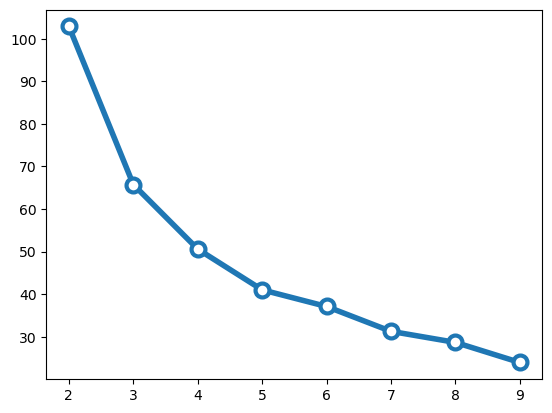

In [479]:
# Number of clusters to try out
n_clusters = list(range(2, 10))

# Run kmeans for each value of k
inertias = []
for k in n_clusters:
    
    # Initialize and run
    kmeans = KMeans(n_clusters=k, n_init=10)
    kmeans.fit(amenities_nb_scaled)
    
    # Save the "inertia"
    inertias.append(kmeans.inertia_)
    
# Plot it!
plt.plot(n_clusters, inertias, marker='o', ms=10, mfc='white', lw=4, mew=3);

In [481]:
from kneed import KneeLocator

# Initialize the knee algorithm
kn = KneeLocator(n_clusters, inertias, curve='convex', direction='decreasing')

# Print out the knee 
print(kn.knee)

4
